<a href="https://colab.research.google.com/github/MRobalinho/Multispectral_Images/blob/master/My_Multispectral_Images_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Read Multispectral images
https://pcjericks.github.io/py-gdalogr-cookbook/raster_layers.html

https://rasterio.readthedocs.io/en/latest/topics/reading.html

## Bands and Wavelengths
When talking about spectral data, we talk from both, the electromagnetic spectrum and image bands. Spectral remote sensing data are collected by powerful camera-like instruments known as imaging spectrometers. Imaging spectrometers collect reflected light energy in “bands.”

A band represents a segment of the electromagnetic spectrum. For example, the wavelength values between 800 nanometers (nm) and 850 nm might be one band captured by an imaging spectrometer. The imaging spectrometer collects reflected light energy within a pixel area on the ground. Since an imaging spectrometer collects many different types of light - for each pixel the amount of light energy for each type of light or band will be recorded. So, for example, a camera records the amount of red, green and blue light for each pixel.

Often when we work with a multispectral dataset, the band information is reported as the center wavelength value. This value represents the center point value of the wavelengths represented in that band. Thus in a band spanning 800-850 nm, the center would be 825 nm.

## Spectral Resolution
The spectral resolution of a dataset that has more than one band, refers to the spectral width of each band in the dataset. While a general spectral resolution of the sensor is often provided, not all sensors collect information within bands of uniform widths.

## Spatial Resolution
The spatial resolution of a raster represents the area on the ground that each pixel covers. If you have smaller pixels in a raster the data will appear more “detailed.” If you have large pixels in a raster, the data will appear more coarse or “fuzzy.”

## Multispectral Imagery
One type of multispectral imagery that is familiar to many of us is a color image. A color image consists of three bands: red, green, and blue. Each band represents light reflected from the red, green or blue portions of the electromagnetic spectrum. The pixel brightness for each band, when composited creates the colors that you see in an image. These colors are the ones your eyes can see within the visible portion of the electromagnetic spectrum. In a Multispectral image we can plot each band of a multi-band image individually using a grayscale color gradient.

https://www.earthdatascience.org/courses/earth-analytics-python/multispectral-remote-sensing-in-python/intro-multispectral-data/


MRobalinho 9-2-2019

In [0]:
# Readind (upload) Files
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving TCF681.tif to TCF681 (1).tif
Saving TCF691.tif to TCF691.tif
User uploaded file "TCF681.tif" with length 9437724 bytes
User uploaded file "TCF691.tif" with length 9437724 bytes


In [0]:
# Verify my current folder
import os
currDir = os.path.dirname(os.path.realpath("__file__"))
print(currDir)                   

/content


In [0]:
# Path to the image files
path = currDir

file1 = path +'/'+ "TCF691.tif"

# Using PIL to read images

In [0]:
# Read TIFF Image
from PIL import Image
tiff = Image.open(file1)

print('File name:',file1 , '     Size File:',tiff.size, '    Format file:',tiff.format)

File name: /content/TCF691.tif      Size File: (2048, 1536)     Format file: TIFF


In [0]:
# Print Bands from image
tiff.getbands()

('R', 'G', 'B')

In [0]:
# Display extrems from each band
tiff.getextrema()

((13, 215), (13, 215), (10, 212))

In [0]:
print(tiff.getcolors())

None


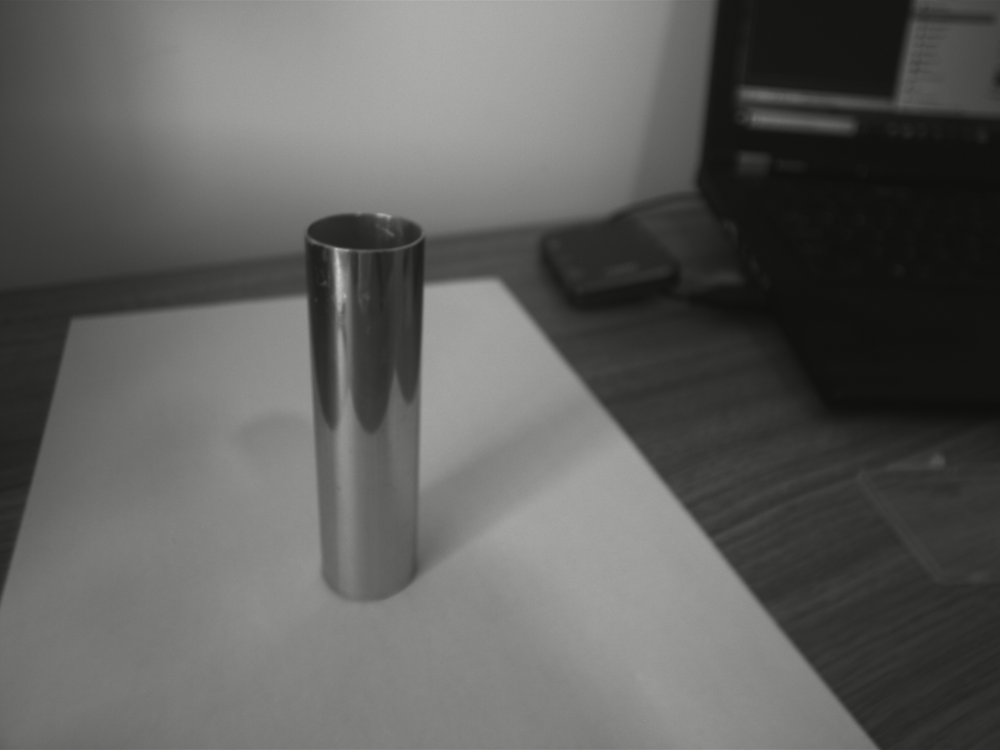

In [0]:
# Show Tiff image
tiff.show('Test')
tiff

In [0]:
# Read Image definitions
print( '   File Size :',tiff.size, '    Format file:',tiff.format, '   Mode File:', tiff.mode)

   File Size : (2048, 1536)     Format file: TIFF    Mode File: RGB


In [0]:
aFile  = Image.open(file1)

# Transform Image to array
aArray = np.array(aFile)
#a[:,:,0] *=0
#a[:,:,1] *=0

# Transform array to Image
cImage = Image.fromarray(aArray)
aArray 

array([[[ 79,  79,  77],
        [ 69,  69,  67],
        [ 82,  82,  81],
        ...,
        [ 62,  62,  60],
        [ 86,  86,  84],
        [ 63,  63,  63]],

       [[ 54,  54,  51],
        [ 77,  77,  74],
        [ 57,  57,  56],
        ...,
        [ 81,  81,  78],
        [ 51,  51,  48],
        [ 80,  80,  80]],

       [[ 76,  76,  76],
        [ 63,  63,  61],
        [ 76,  76,  75],
        ...,
        [ 60,  60,  57],
        [ 82,  82,  81],
        [ 60,  60,  58]],

       ...,

       [[ 80,  80,  77],
        [109, 109, 109],
        [ 80,  80,  77],
        ...,
        [ 47,  47,  45],
        [ 36,  36,  35],
        [ 44,  44,  41]],

       [[110, 110, 108],
        [ 92,  92,  90],
        [111, 111, 111],
        ...,
        [ 44,  44,  44],
        [ 48,  48,  47],
        [ 44,  44,  42]],

       [[ 90,  90,  88],
        [114, 114, 112],
        [ 92,  92,  89],
        ...,
        [ 49,  49,  46],
        [ 42,  42,  41],
        [ 48,  48,  46]]

In [0]:
# Look from an chanel from then image

def channel(img, n):
    """Isolate the nth channel from the image.

       n = 0: red, 1: green, 2: blue
    """
    a = np.array(img)
    a[:,:,(n!=0, n!=1, n!=2)] *= 0
#    a[:,:,n] *= 0
    print(Image.fromarray(a), 'Get Channel n: ', n)
  
    return Image.fromarray(a)

# def to resize 
# Given parameters : image , number to divide (resize)
def imageResize(img, n):
    width, height = img.size 

    print('Original size:', width, '/', height, 'Resize:',n)
    
    newWidth = int(width / n)
    newHeight = int(height / n)
    img.resize((newWidth, newHeight), Image.ANTIALIAS)
    print('New size:', newWidth, '/', newHeight)
    return img

<PIL.Image.Image image mode=RGB size=2048x1536 at 0x7F5BFD9BDF60> Get Channel n:  0


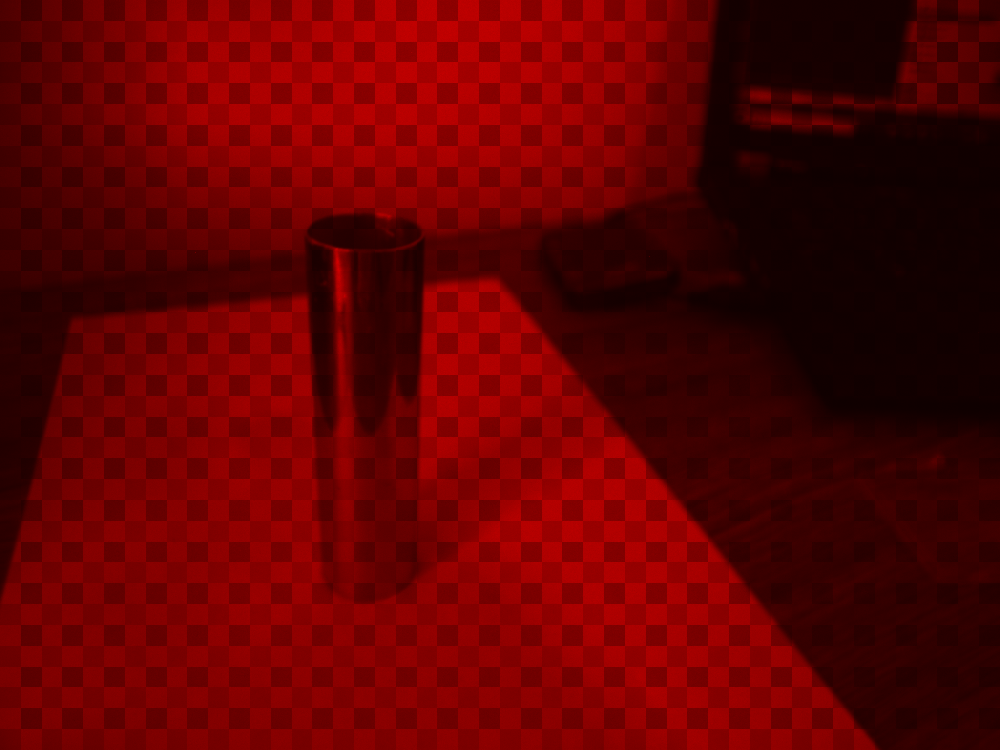

In [0]:
# Get channel 0
x0_channel = channel(cImage, 0)
x0_channel

<PIL.Image.Image image mode=RGB size=2048x1536 at 0x7F5BFD9BD2E8> Get Channel n:  1


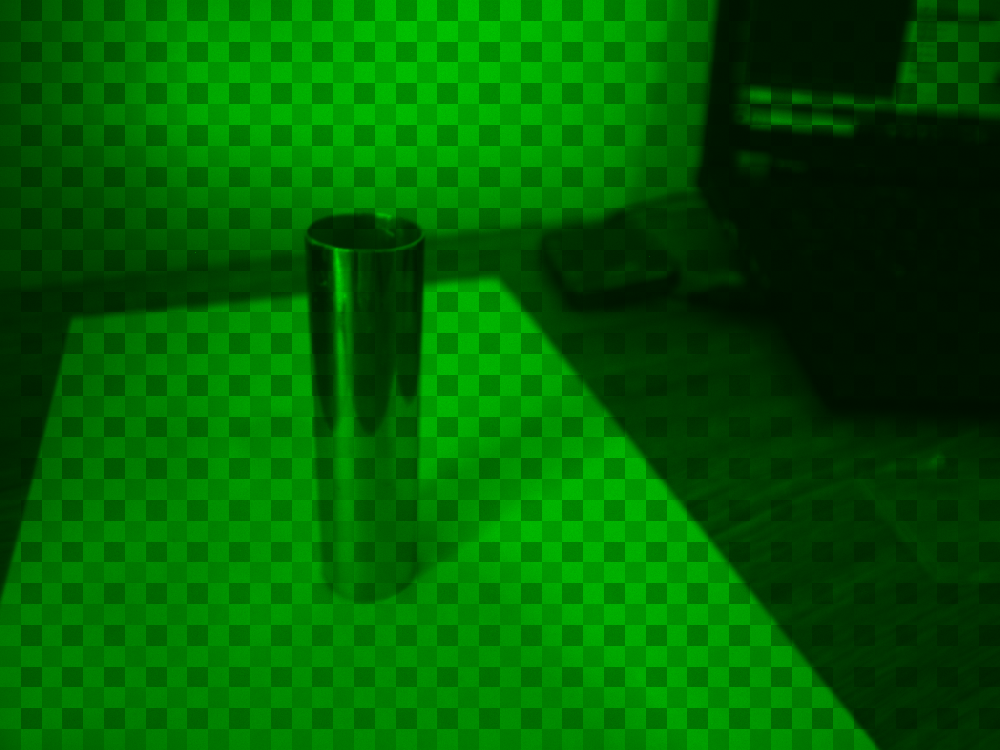

In [0]:
# Get channel 1
x1_channel = channel(cImage, 1)
x1_channel

<PIL.Image.Image image mode=RGB size=2048x1536 at 0x7F5BFD9BD208> Get Channel n:  2


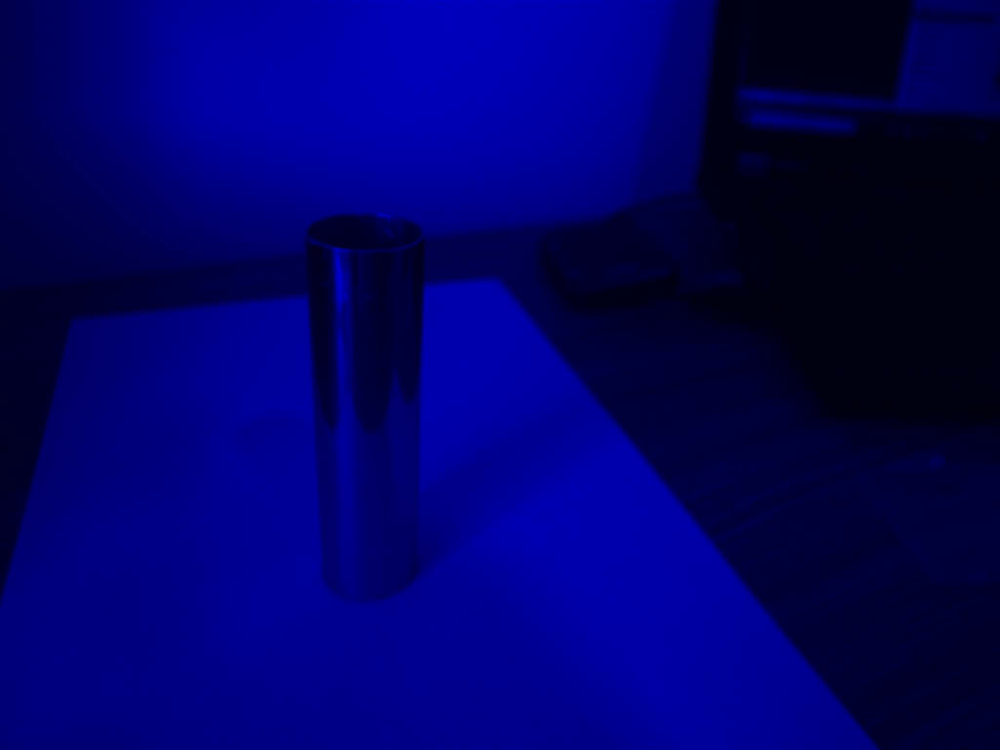

In [0]:
# Get channel 2
x2_channel = channel(cImage, 2)
x2_channel

In [0]:
# Resize Image
xFile = imageResize(aFile, 20)
   
          
#Saved in the same relative location 
xFile.save("resized_picture.jpg") 

Original size: 2048 / 1536 Resize: 20
New size: 102 / 76


In [0]:
print(xFile)

<PIL.TiffImagePlugin.TiffImageFile image mode=RGB size=2048x1536 at 0x7F5BFD5A1E48>


In [0]:
# Getting histogram of image 
aHistgram = aFile.histogram()
print(aHistgram)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 58, 1927, 13001, 39595, 62160, 70179, 59921, 38772, 26583, 27067, 19838, 11849, 8208, 7161, 6463, 6084, 5830, 5996, 6515, 7125, 8307, 9663, 10641, 12232, 13436, 14793, 16323, 18563, 20309, 21487, 23485, 25643, 27142, 28224, 28890, 29202, 28887, 28567, 27911, 27538, 26814, 26708, 26568, 26460, 26056, 25431, 23993, 22434, 20457, 18644, 16934, 15426, 13944, 12694, 11481, 10791, 10224, 9708, 9374, 9200, 9101, 9054, 9174, 9487, 9901, 10023, 10201, 10176, 10433, 9944, 9847, 9904, 9916, 9652, 10065, 10289, 10502, 11171, 11413, 12084, 12747, 13126, 13651, 14151, 14111, 14151, 14044, 14210, 15097, 15749, 16306, 17268, 18045, 18666, 19747, 20380, 21315, 22062, 22681, 23331, 23535, 23664, 23319, 22656, 22560, 21838, 21513, 21416, 21876, 22603, 23735, 24677, 26082, 27503, 29305, 30599, 32152, 32247, 31191, 30229, 28408, 26881, 25789, 24969, 24870, 24557, 24263, 24469, 24580, 24507, 24054, 23425, 22837, 22106, 21641, 21532, 21570, 21895, 21739, 21516, 20912, 

In [0]:
# Getting histogram of image of channel 0 - R
aHist_0= x0_channel.histogram() 
print(aHist_0)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 58, 1927, 13001, 39595, 62160, 70179, 59921, 38772, 26583, 27067, 19838, 11849, 8208, 7161, 6463, 6084, 5830, 5996, 6515, 7125, 8307, 9663, 10641, 12232, 13436, 14793, 16323, 18563, 20309, 21487, 23485, 25643, 27142, 28224, 28890, 29202, 28887, 28567, 27911, 27538, 26814, 26708, 26568, 26460, 26056, 25431, 23993, 22434, 20457, 18644, 16934, 15426, 13944, 12694, 11481, 10791, 10224, 9708, 9374, 9200, 9101, 9054, 9174, 9487, 9901, 10023, 10201, 10176, 10433, 9944, 9847, 9904, 9916, 9652, 10065, 10289, 10502, 11171, 11413, 12084, 12747, 13126, 13651, 14151, 14111, 14151, 14044, 14210, 15097, 15749, 16306, 17268, 18045, 18666, 19747, 20380, 21315, 22062, 22681, 23331, 23535, 23664, 23319, 22656, 22560, 21838, 21513, 21416, 21876, 22603, 23735, 24677, 26082, 27503, 29305, 30599, 32152, 32247, 31191, 30229, 28408, 26881, 25789, 24969, 24870, 24557, 24263, 24469, 24580, 24507, 24054, 23425, 22837, 22106, 21641, 21532, 21570, 21895, 21739, 21516, 20912, 

In [0]:
# Getting histogram of image of channel 1 - B
aHist_1= x1_channel.histogram() 
print(aHist_1)

[3145728, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 58, 1927, 13001, 39595, 62160, 70179, 59921, 38772, 26583, 27067, 19838, 11849, 8208, 7161, 6463, 6084, 5830, 5996, 6515, 7125, 8307, 9663, 10641, 12232, 13436, 14793, 16323, 18563, 2030

In [0]:
# Getting histogram of image of channel 2 - B 
aHist_2= x2_channel.histogram() 
print(aHist_2)

[3145728, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3145728, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

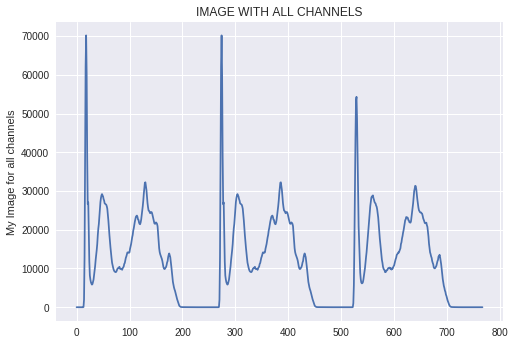

In [0]:
import matplotlib.pyplot as plt

plt.plot(aHistgram)
plt.title('IMAGE WITH ALL CHANNELS')
plt.ylabel('My Image for all channels')
plt.show()

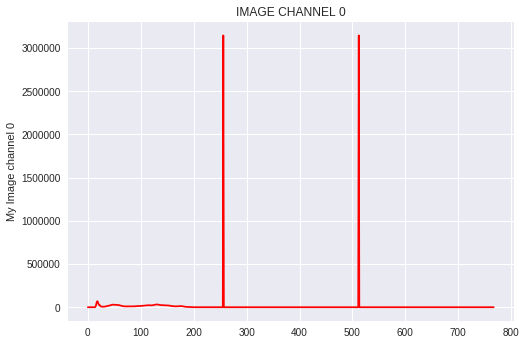

In [0]:
plt.plot(aHist_0, color='r')
plt.title('IMAGE CHANNEL 0')
plt.ylabel('My Image channel 0')
plt.show()

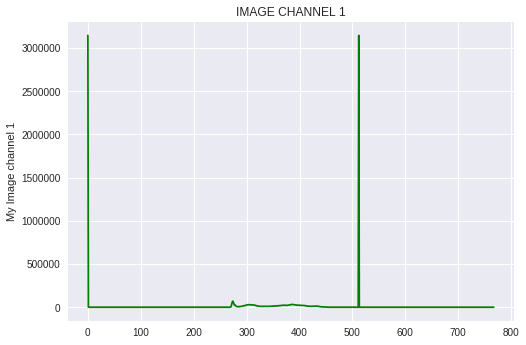

In [0]:
plt.plot(aHist_1, color='g')
plt.title('IMAGE CHANNEL 1')
plt.ylabel('My Image channel 1')
plt.show()

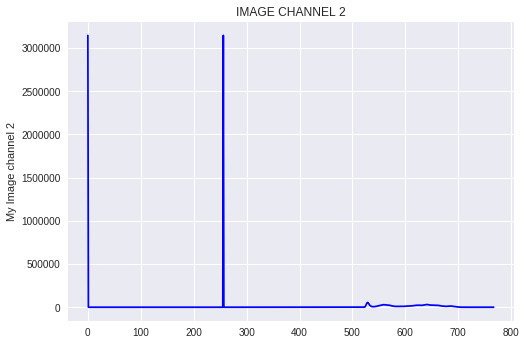

In [0]:
plt.plot(aHist_2, color='b')
plt.title('IMAGE CHANNEL 2')
plt.ylabel('My Image channel 2')
plt.show()

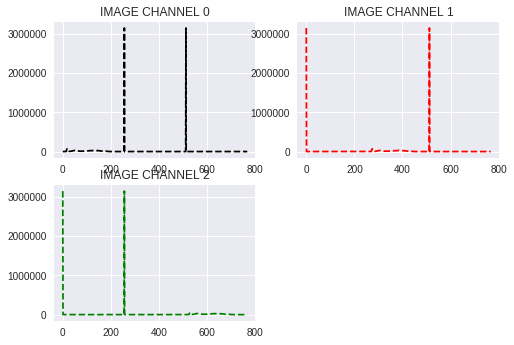

In [0]:
plt.figure(1)
plt.subplot(221)
plt.title('IMAGE CHANNEL 0')
plt.plot(aHist_0,   'k--')

plt.subplot(222)
plt.title('IMAGE CHANNEL 1')
plt.plot(aHist_1,  'r--')

plt.subplot(223)
plt.title('IMAGE CHANNEL 2')
plt.plot(aHist_2,  'g--')
plt.show()

## Using Matplotlib

In [0]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

# Read in the image and print some stats
image = mpimg.imread(file1)
print('This image is: ',type(image), 
     'with dimensions:', image.shape)

This image is:  <class 'numpy.ndarray'> with dimensions: (1536, 2048, 3)


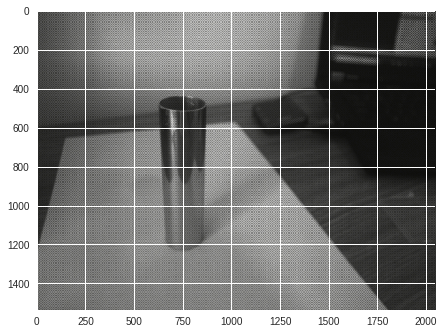

In [0]:
# Plotting the image

imgplot=plt.imshow(image)
plt.show()# Using Matplotlib to plot the Image


In [0]:
#splitting the image 
print(aFile.split()) 

(<PIL.Image.Image image mode=L size=2048x1536 at 0x7F5BFD84EB70>, <PIL.Image.Image image mode=L size=2048x1536 at 0x7F5BFD84EEF0>, <PIL.Image.Image image mode=L size=2048x1536 at 0x7F5BFD5A10F0>)


In [0]:
bFile = aFile.split()
bFile

(<PIL.Image.Image image mode=L size=2048x1536 at 0x7F5BFD81C080>,
 <PIL.Image.Image image mode=L size=2048x1536 at 0x7F5BFD81CB00>,
 <PIL.Image.Image image mode=L size=2048x1536 at 0x7F5BFD81C2E8>)

In [0]:
#In-place modification 
cFile = cImage.thumbnail((200, 200)) 


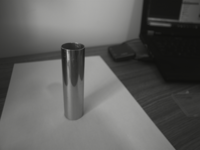

In [0]:
cImage

In [0]:
print(tiff.mode) 
          
#converting image to bitmap 
print(tiff.tobitmap()) 
          
print(type(tiff.tobitmap()) )

RGB


ValueError: ignored